# Test 3: airborne survey

import packages

In [1]:
%load_ext autoreload
%autoreload 2
import logging
import os
import pathlib
import pickle
import string

import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
from invert4geom import inversion, optimization, plotting, regional, uncertainty, utils
from polartoolkit import fetch, maps, profiles
from polartoolkit import utils as polar_utils

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/UQpy/__init__.py:6: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



In [2]:
fpath = "../results/Ross_Sea/Ross_Sea_03"

## Get synthetic model data

requested spacing (2000.0) is smaller than the original (5000.0).


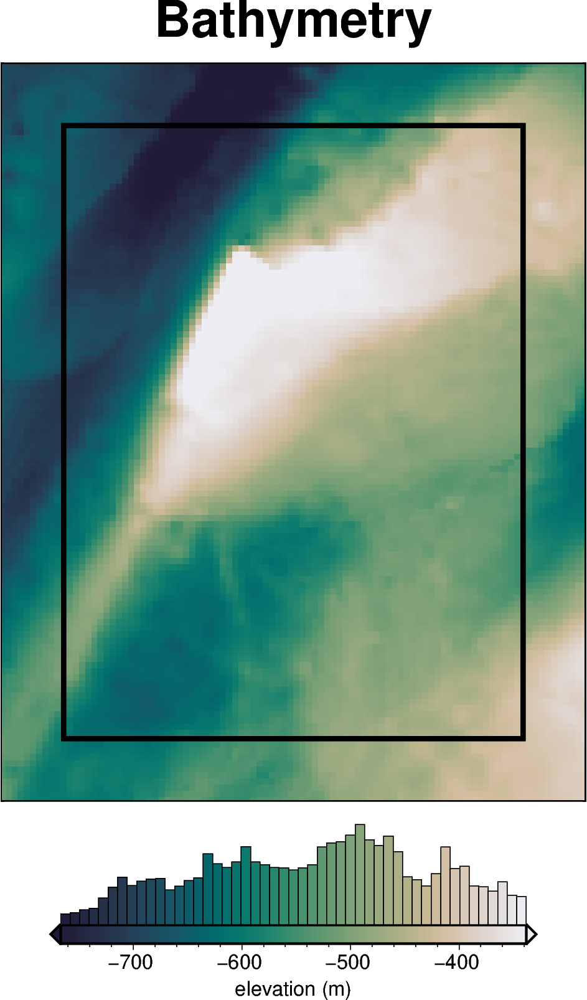

  0%|          | 0/7676 [00:00<?, ?it/s]

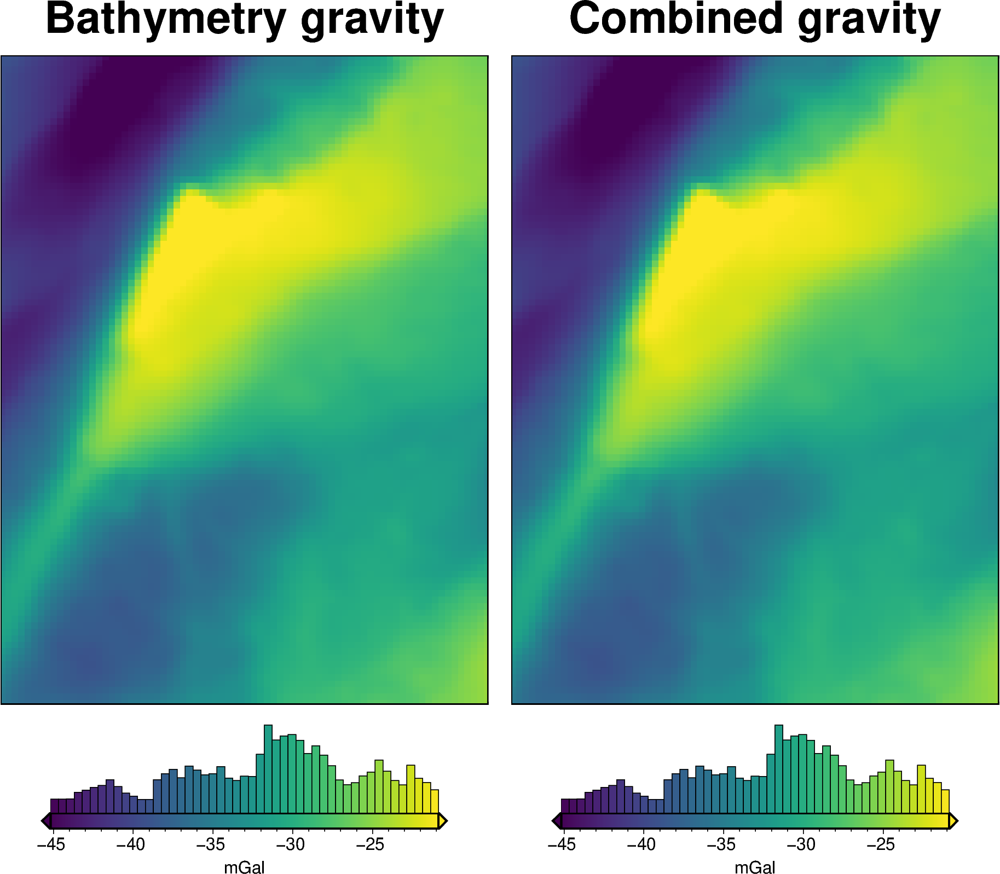

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

# rename the full res gravity column
grav_df = grav_df.rename(columns={"gravity_anomaly": "gravity_anomaly_full_res"})

In [4]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res
0,-1600000.0,-40000.0,1000.0,-35.551055,0,-35.551055,-35.551055
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-36.054657
2,-1600000.0,-36000.0,1000.0,-36.473147,0,-36.473147,-36.473147
3,-1600000.0,-34000.0,1000.0,-36.755609,0,-36.755609,-36.755609
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-36.951029


### Create synthetic airborne survey

plotted values not provided via 'grid', so cannot determine if to add colorbar end triangles or not.


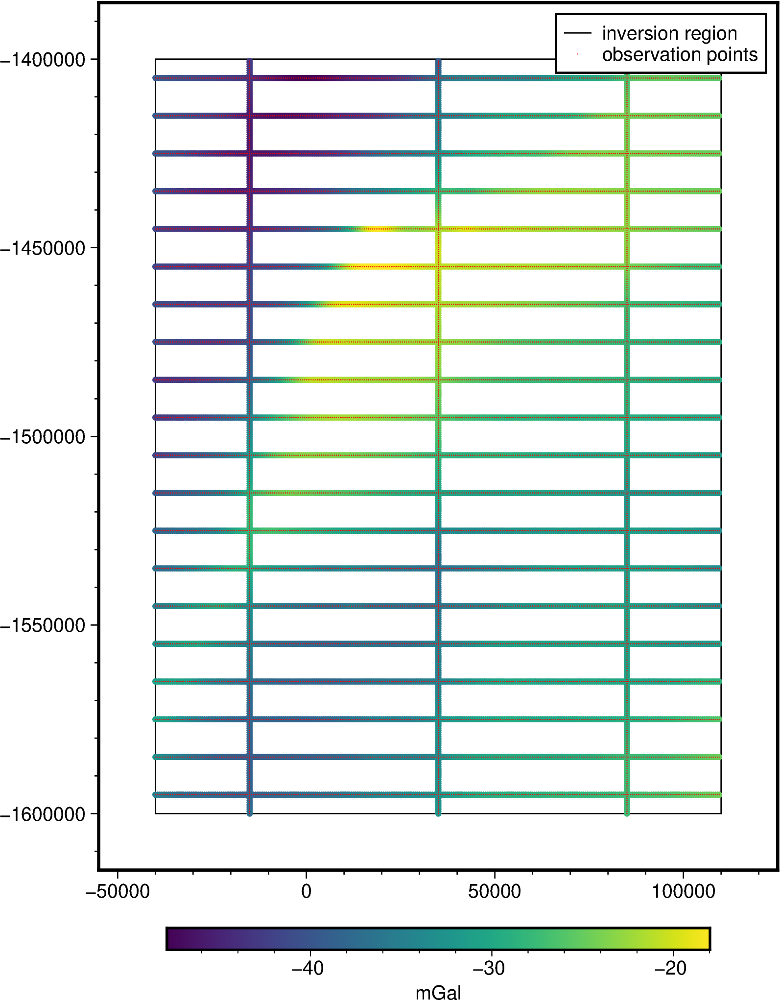

,northing,easting,upward,line,time,geometry,dist_along_line,gravity_anomaly
0,-1600000.0,-15000.0,1000.0,1000.0,0.0,POINT (-15000 -1600000),0.0,-37.186843
1,-1600000.0,35000.0,1000.0,1010.0,0.0,POINT (35000 -1600000),0.0,-32.340147
2,-1600000.0,85000.0,1000.0,1020.0,0.0,POINT (85000 -1600000),0.0,-27.510170
3,-1599500.0,-15000.0,1000.0,1000.0,1.0,POINT (-15000 -1599500),500.0,-37.302458
4,-1599500.0,35000.0,1000.0,1010.0,1.0,POINT (35000 -1599500),500.0,-32.358626
...,...,...,...,...,...,...,...,...
5995,-1405000.0,107500.0,1000.0,29.0,295.0,POINT (107500 -1405000),147500.0,-25.738786
5996,-1405000.0,108000.0,1000.0,29.0,296.0,POINT (108000 -1405000),148000.0,-25.748257
5997,-1405000.0,108500.0,1000.0,29.0,297.0,POINT (108500 -1405000),148500.0,-25.754398
5998,-1405000.0,109000.0,1000.0,29.0,298.0,POINT (109000 -1405000),149000.0,-25.757028


In [5]:
grav_survey_df = synthetic.airborne_survey(
    along_line_spacing=500,
    grav_observation_height=1e3,
    ns_line_spacing=50e3,
    ew_line_spacing=10e3,
    region=inversion_region,
    grav_grid=grav_df.set_index(
        ["northing", "easting"]
    ).gravity_anomaly_full_res.to_xarray(),
    plot=True,
)
grav_survey_df

In [6]:
num_ties = len(grav_survey_df[grav_survey_df.line >= 1000].line.unique())
num_flights = len(grav_survey_df[grav_survey_df.line < 1000].line.unique())
(
    num_flights,
    num_ties,
)

(20, 3)

In [7]:
x_spacing = (inversion_region[1] - inversion_region[0]) / num_ties
y_spacing = (inversion_region[3] - inversion_region[2]) / num_flights
grav_line_spacing = ((x_spacing + y_spacing) / 2) / 1e3
grav_line_spacing

30.0

In [8]:
w = np.abs(inversion_region[1] - inversion_region[0]) / 1e3
h = np.abs(inversion_region[3] - inversion_region[2]) / 1e3
w, h

(np.float64(150.0), np.float64(200.0))

In [9]:
flight_kms = w * num_ties + h * num_flights
flight_kms

np.float64(4450.0)

In [10]:
inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inversion_area

30000.0

In [11]:
flight_kms_per_10000sq_km = (flight_kms / inversion_area) * 10e3
flight_kms_per_10000sq_km

np.float64(1483.3333333333335)

requested spacing (100) is smaller than the original (2000.0).


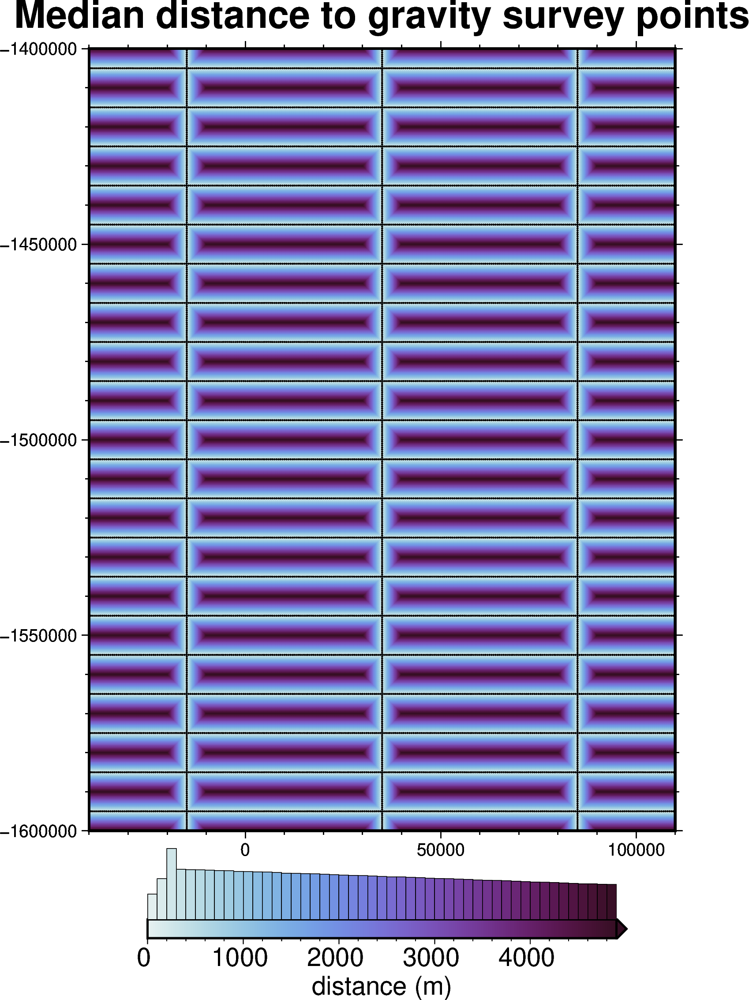

mean minimum distance: 2344 m
median minimum distance: 2300 m


In [12]:
# calculate gravity data median distance
grd = bathymetry.sel(
    easting=slice(*inversion_region[:2]), northing=slice(*inversion_region[2:])
)

grd = fetch.resample_grid(grd, spacing=100, verbose="q").rename(
    {"x": "easting", "y": "northing"}
)

min_dist = utils.dist_nearest_points(
    grav_survey_df,
    grd,
).min_dist

fig = maps.plot_grd(
    min_dist,
    title="Median distance to gravity survey points",
    cbar_label="distance (m)",
    cbar_font="18p,Helvetica,black",
    cmap="dense",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cpt_lims=[
        0,
        polar_utils.get_min_max(
            min_dist,
            robust=True,
        )[1],
    ],
    points=grav_survey_df,
    points_style="p1p",
    points_fill="black",
)
fig.show()
print(f"mean minimum distance: {int(min_dist.mean().to_numpy())} m")
print(f"median minimum distance: {int(min_dist.median().to_numpy())} m")

In [13]:
# save to csv
grav_survey_df.to_csv(f"{fpath}_grav_survey_df.csv", index=False)

In [14]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

eq_study, eqs = optimization.optimize_eq_source_params(
    coords,
    data,
    n_trials=12,
    damping_limits=(1e-3, 10),
    depth_limits=(100, 100e3),
    block_size=spacing,
    plot=True,
    fname=f"{fpath}_eq_sources",
)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

plotting failed with error: Mime type rendering requires nbformat>=4.2.0 but it is not installed


In [15]:
study_df = eq_study.trials_dataframe()
study_df

,number,value,datetime_start,datetime_complete,duration,params_damping,params_depth,system_attrs_fixed_params,state
0,0,-0.895877,2025-10-14 14:29:40.442497,2025-10-14 14:29:49.499828,0 days 00:00:09.057331,0.001000,100.000000,"{'damping': 0.001, 'depth': 100}",COMPLETE
1,1,0.919447,2025-10-14 14:29:49.502569,2025-10-14 14:29:56.768672,0 days 00:00:07.266103,10.000000,100000.000000,"{'damping': 10, 'depth': 100000.0}",COMPLETE
2,2,0.999986,2025-10-14 14:29:56.771327,2025-10-14 14:30:01.375794,0 days 00:00:04.604467,0.001643,10002.265810,NaN,COMPLETE
3,3,0.976299,2025-10-14 14:30:01.380711,2025-10-14 14:30:06.333186,0 days 00:00:04.952475,0.762644,59952.265810,NaN,COMPLETE
4,4,0.994434,2025-10-14 14:30:06.340498,2025-10-14 14:30:12.401418,0 days 00:00:06.060920,0.035399,34977.265810,NaN,COMPLETE
5,5,0.976426,2025-10-14 14:30:12.405263,2025-10-14 14:30:21.988305,0 days 00:00:09.583042,0.004572,84927.265810,NaN,COMPLETE
6,6,0.995391,2025-10-14 14:30:22.019279,2025-10-14 14:30:30.658220,0 days 00:00:08.638941,2.122102,22489.765810,NaN,COMPLETE
7,7,0.975067,2025-10-14 14:30:30.659713,2025-10-14 14:30:33.377640,0 days 00:00:02.717927,0.098499,72439.765810,NaN,COMPLETE
8,8,0.999677,2025-10-14 14:30:33.405174,2025-10-14 14:30:40.256842,0 days 00:00:06.851668,0.001000,19115.478929,NaN,COMPLETE
9,9,0.999350,2025-10-14 14:30:40.258524,2025-10-14 14:30:48.611805,0 days 00:00:08.353281,0.411685,14173.067440,NaN,COMPLETE


In [16]:
q1 = study_df.value.quantile(0.25)
q3 = study_df.value.quantile(0.75)
iqr = q3 - q1
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

study_df2 = study_df[(study_df.value < upper_bound) & (study_df.value > lower_bound)]
study_df2

,number,value,datetime_start,datetime_complete,duration,params_damping,params_depth,system_attrs_fixed_params,state
2,2,0.999986,2025-10-14 14:29:56.771327,2025-10-14 14:30:01.375794,0 days 00:00:04.604467,0.001643,10002.265810,NaN,COMPLETE
3,3,0.976299,2025-10-14 14:30:01.380711,2025-10-14 14:30:06.333186,0 days 00:00:04.952475,0.762644,59952.265810,NaN,COMPLETE
4,4,0.994434,2025-10-14 14:30:06.340498,2025-10-14 14:30:12.401418,0 days 00:00:06.060920,0.035399,34977.265810,NaN,COMPLETE
5,5,0.976426,2025-10-14 14:30:12.405263,2025-10-14 14:30:21.988305,0 days 00:00:09.583042,0.004572,84927.265810,NaN,COMPLETE
6,6,0.995391,2025-10-14 14:30:22.019279,2025-10-14 14:30:30.658220,0 days 00:00:08.638941,2.122102,22489.765810,NaN,COMPLETE
7,7,0.975067,2025-10-14 14:30:30.659713,2025-10-14 14:30:33.377640,0 days 00:00:02.717927,0.098499,72439.765810,NaN,COMPLETE
8,8,0.999677,2025-10-14 14:30:33.405174,2025-10-14 14:30:40.256842,0 days 00:00:06.851668,0.001000,19115.478929,NaN,COMPLETE
9,9,0.999350,2025-10-14 14:30:40.258524,2025-10-14 14:30:48.611805,0 days 00:00:08.353281,0.411685,14173.067440,NaN,COMPLETE
10,10,0.977453,2025-10-14 14:30:48.613812,2025-10-14 14:30:58.976850,0 days 00:00:10.363038,10.000000,45394.055476,NaN,COMPLETE
11,11,0.999952,2025-10-14 14:30:58.998486,2025-10-14 14:31:05.847557,0 days 00:00:06.849071,0.001000,13499.630288,NaN,COMPLETE


In [17]:
stdev = np.log10(study_df2.params_damping).std()

stdev = stdev / 4
stdev

np.float64(0.3664621982405064)

best: 0.0016430661458014173 
std: 0.3664621982405064 
+1std: 0.003820473975280557 
-1std: 0.0007066312653734211


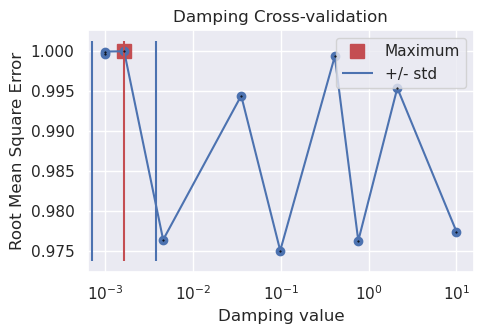

In [18]:
df = study_df2.sort_values(by="value")
fig = plotting.plot_cv_scores(
    df.value,
    df.params_damping,
    param_name="Damping",
    logx=True,
    best="max",
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

In [19]:
stdev = study_df2.params_depth.std()
stdev = stdev / 4
stdev

np.float64(6709.298875064652)

best: 10002.265810449084 
std: 6709.298875064652 
+1std: 16711.564685513735 
-1std: 3292.966935384432


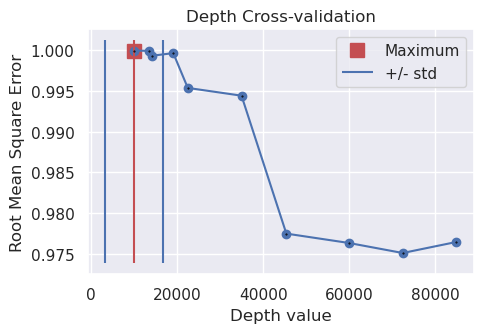

In [20]:
df = study_df2.sort_values(by="value")
fig = plotting.plot_cv_scores(
    df.value,
    df.params_depth,
    param_name="Depth",
    best="max",
)
ax = fig.axes[0]

best = float(study_df2.params_depth.iloc[0])
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()

ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

In [21]:
# predict sources onto grid
grav_df["eqs_gravity_anomaly"] = eqs.predict(
    (
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,  # either grav_df.upward or user-set constant value
    ),
)

grav_df["gravity_anomaly"] = grav_df.eqs_gravity_anomaly
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551055,0,-35.551055,-35.551055,-33.273917,-33.273917
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-36.054657,-33.983594,-33.983594
2,-1600000.0,-36000.0,1000.0,-36.473147,0,-36.473147,-36.473147,-34.554225,-34.554225
3,-1600000.0,-34000.0,1000.0,-36.755609,0,-36.755609,-36.755609,-35.014135,-35.014135
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-36.951029,-35.365702,-35.365702
...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-25.760090,-24.851786,-24.851786
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-25.911429,-24.853220,-24.853220
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-26.032814,-24.843369,-24.843369
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-26.121903,-24.781222,-24.781222


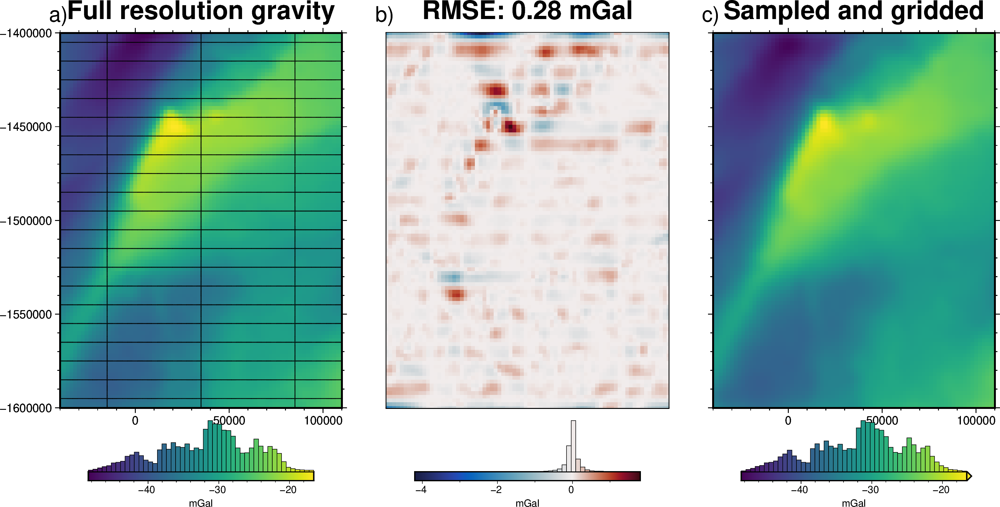

In [22]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# plot the synthetic gravity anomaly grid
lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res)

fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Full resolution gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = grav_grid.gravity_anomaly_full_res - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    title=f"RMSE: {round(utils.rmse(dif), 2)} mGal",
    cbar_label="mGal",
    hist=True,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Sampled and gridded",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.show()

## Make starting bathymetry model

In [23]:
# semi-regularly spaced
constraint_points = synthetic.constraint_layout_number(
    shape=(6, 7),
    region=inversion_region,
    padding=-spacing,
    shapefile="../results/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,inside,true_upward,upward
0,-1600000.0,-40000.0,False,-601.093994,-601.093994
1,-1600000.0,-38000.0,False,-609.216919,-609.216919
2,-1600000.0,-36000.0,False,-616.355957,-616.355957
3,-1600000.0,-34000.0,False,-621.262268,-621.262268
4,-1600000.0,-32000.0,False,-625.510925,-625.510925


In [24]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)

starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-541.24413869, -544.57181187, -547.92293689, ..., -360.00006254,
        -357.06767408, -354.19957766],
       [-543.34402688, -546.81675803, -550.35256333, ..., -362.90253226,
        -359.96874158, -357.11431886],
       [-545.05533622, -548.66036838, -552.37518163, ..., -365.66137905,
        -362.73269531, -359.90052824],
       ...,
       [-591.95335283, -595.518822  , -599.06869705, ..., -440.89315875,
        -440.6944619 , -440.40553782],
       [-590.53134833, -594.09076637, -597.64079288, ..., -440.69158328,
        -440.42525249, -440.07197234],
       [-589.16632671, -592.73504777, -596.30209679, ..., -440.51760947,
        -440.1713932 , -439.74434037]], shape=(121, 96))
Coordinates:
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [25]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.03 m


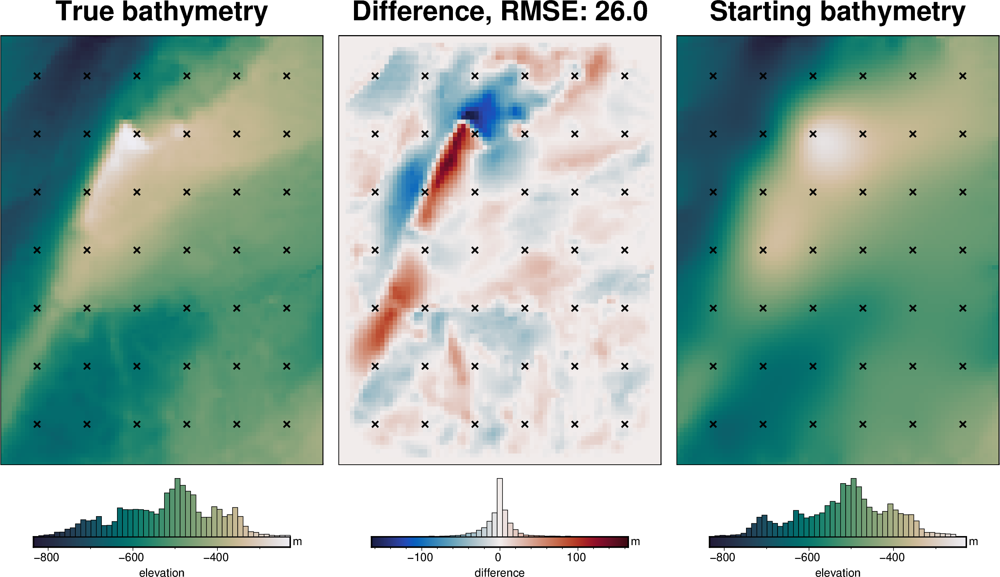

In [26]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [27]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551055,0,-35.551055,-35.551055,-33.273917,-33.273917,-32.541367
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-36.054657,-33.983594,-33.983594,-32.965831
2,-1600000.0,-36000.0,1000.0,-36.473147,0,-36.473147,-36.473147,-34.554225,-34.554225,-33.347648
3,-1600000.0,-34000.0,1000.0,-36.755609,0,-36.755609,-36.755609,-35.014135,-35.014135,-33.644496
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-36.951029,-35.365702,-35.365702,-33.840063
...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-25.760090,-24.851786,-24.851786,-23.321506
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-25.911429,-24.853220,-24.853220,-23.482116
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-26.032814,-24.843369,-24.843369,-23.605602
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-26.121903,-24.781222,-24.781222,-23.693171


In [28]:
regional_grav_kwargs = dict(
    method="constant",
    constraints_df=constraint_points,
)

In [29]:
grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,misfit,reg,res
0,-1600000.0,-40000.0,1000.0,-35.551055,0,-35.551055,-35.551055,-33.273917,-33.273917,-32.541367,-0.732550,-2.646595,1.914045
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-36.054657,-33.983594,-33.983594,-32.965831,-1.017764,-2.646595,1.628831
2,-1600000.0,-36000.0,1000.0,-36.473147,0,-36.473147,-36.473147,-34.554225,-34.554225,-33.347648,-1.206577,-2.646595,1.440018
3,-1600000.0,-34000.0,1000.0,-36.755609,0,-36.755609,-36.755609,-35.014135,-35.014135,-33.644496,-1.369640,-2.646595,1.276955
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-36.951029,-35.365702,-35.365702,-33.840063,-1.525639,-2.646595,1.120956
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-25.760090,-24.851786,-24.851786,-23.321506,-1.530281,-2.646595,1.116314
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-25.911429,-24.853220,-24.853220,-23.482116,-1.371105,-2.646595,1.275490
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-26.032814,-24.843369,-24.843369,-23.605602,-1.237767,-2.646595,1.408828
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-26.121903,-24.781222,-24.781222,-23.693171,-1.088052,-2.646595,1.558543


makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


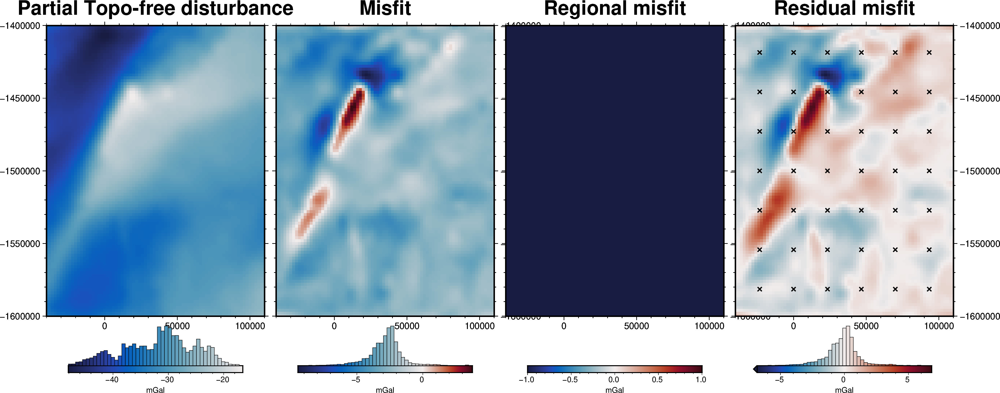

In [30]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [31]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

## Damping Cross Validation

In [32]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    fname=f"{fpath}_damping_cv",
    **kwargs,
)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [33]:
# load saved inversion results
with pathlib.Path(f"{fpath}_damping_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [34]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.014177009401440639

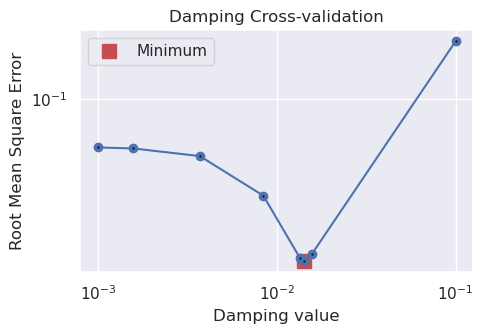

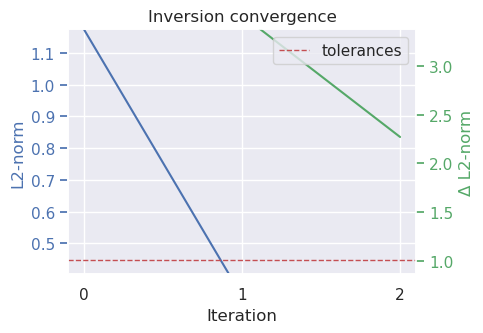

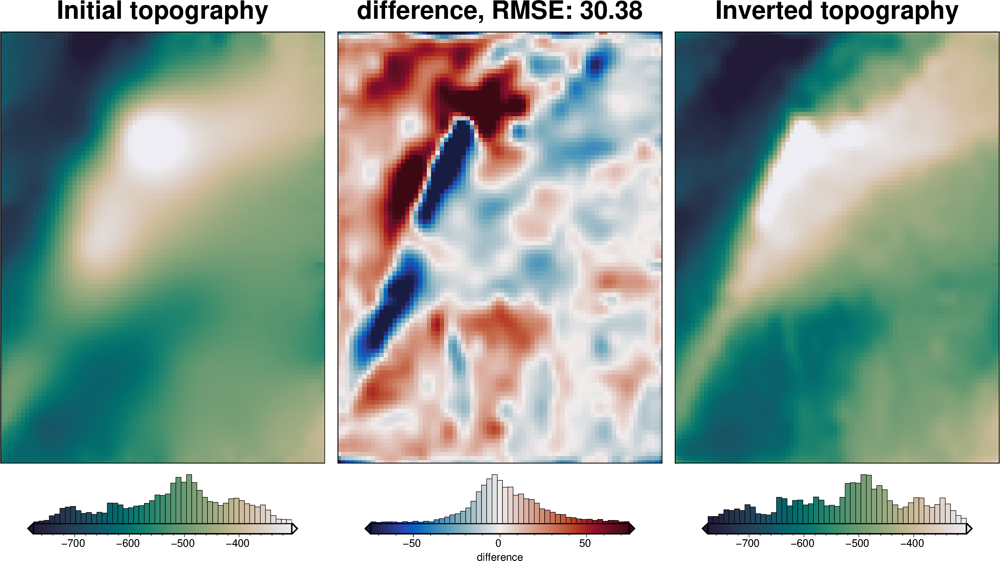

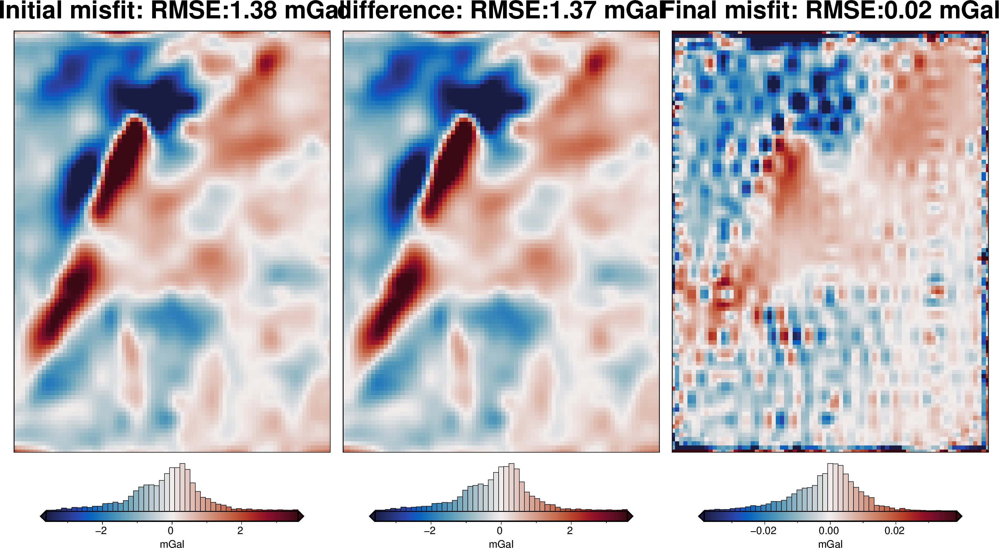

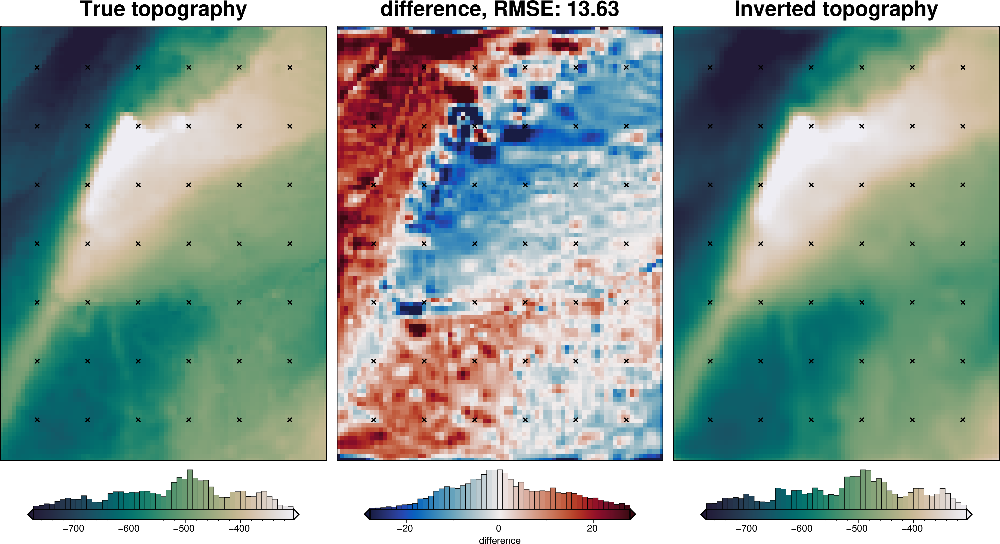

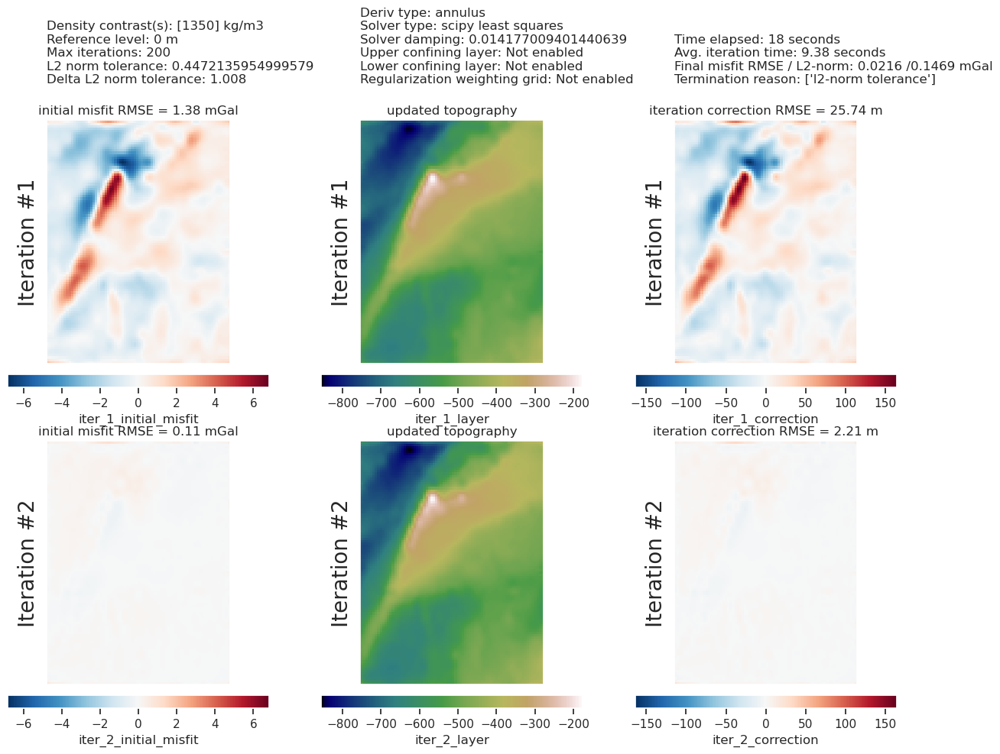

In [35]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [36]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 19.55 m


## Density CV

In [37]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_topography=starting_bathymetry,
    zref=0,
    calculate_regional_misfit=True,
    regional_grav_kwargs=dict(
        grav_df=grav_df,
        method="constant",
        constant=0,
    ),
    run_zref_or_density_cv=True,
    constraints_df=constraint_points,
    density_contrast_limits=(1000, 2400),
    zref_density_cv_trials=10,
    fname=f"{fpath}_density_cv",
    **kwargs,
)

'reg' already a column of `grav_df`, but is being overwritten since calculate_regional_misfit is True


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

'starting_gravity' already a column of `grav_df`, but is being overwritten since calculate_starting_gravity is True
'reg' already a column of `grav_df`, but is being overwritten since calculate_regional_misfit is True


In [38]:
# load saved inversion results
with pathlib.Path(f"{fpath}_density_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

In [39]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1464
real density contrast 1476


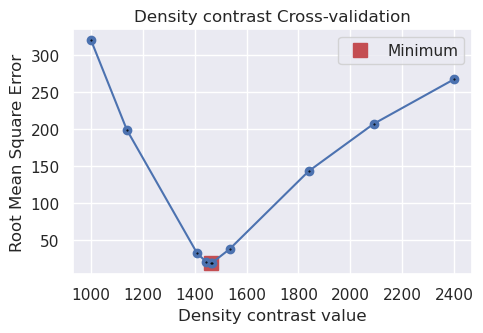

In [40]:
study_df = study.trials_dataframe()

fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_density_contrast,
    param_name="Density contrast",
)

### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [41]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

  0%|          | 0/7676 [00:00<?, ?it/s]

makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


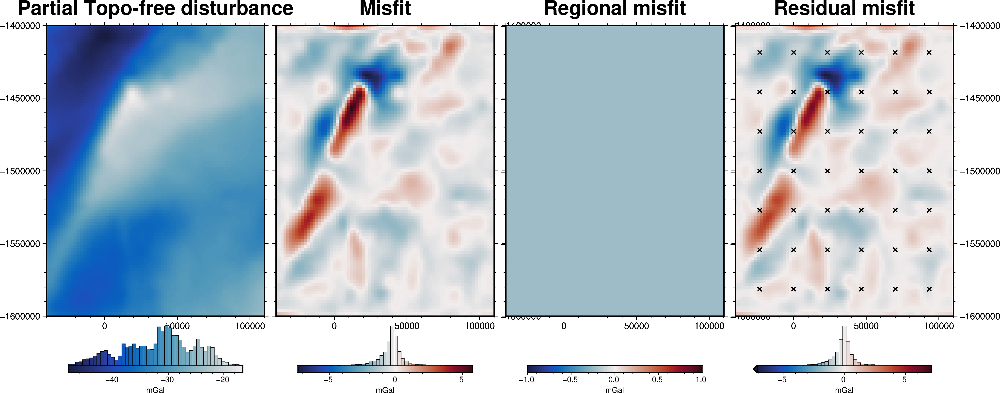

In [42]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

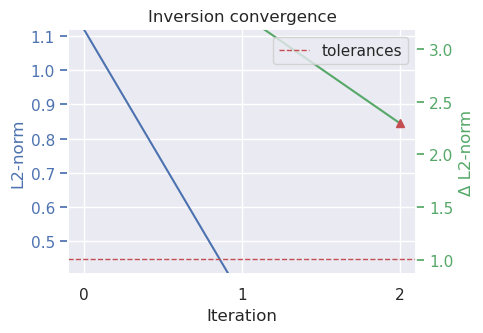

In [43]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname=f"{fpath}_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [44]:
# load saved inversion results
with pathlib.Path(f"{fpath}_optimal_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

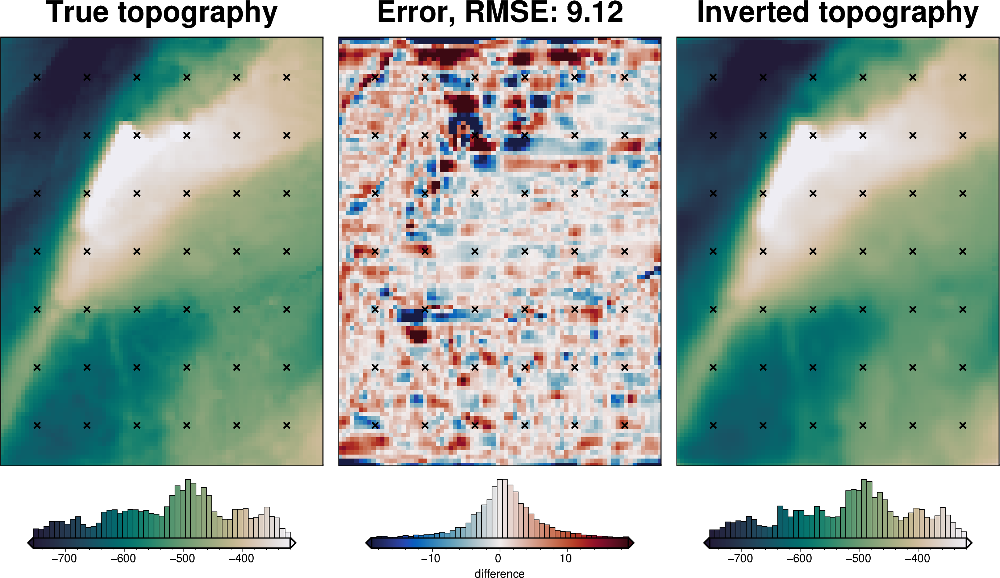

In [45]:
_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    fig_height=10,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="Error",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

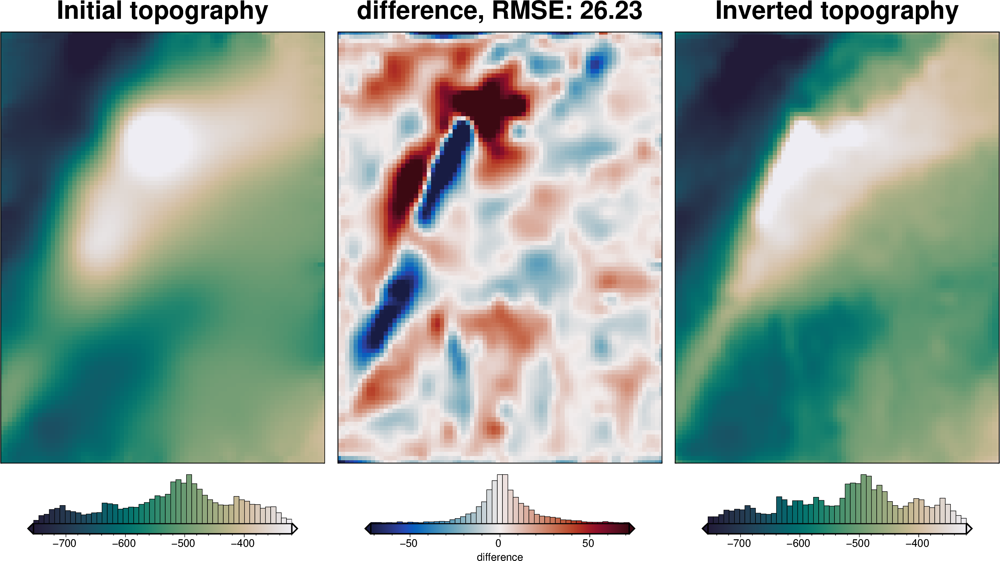

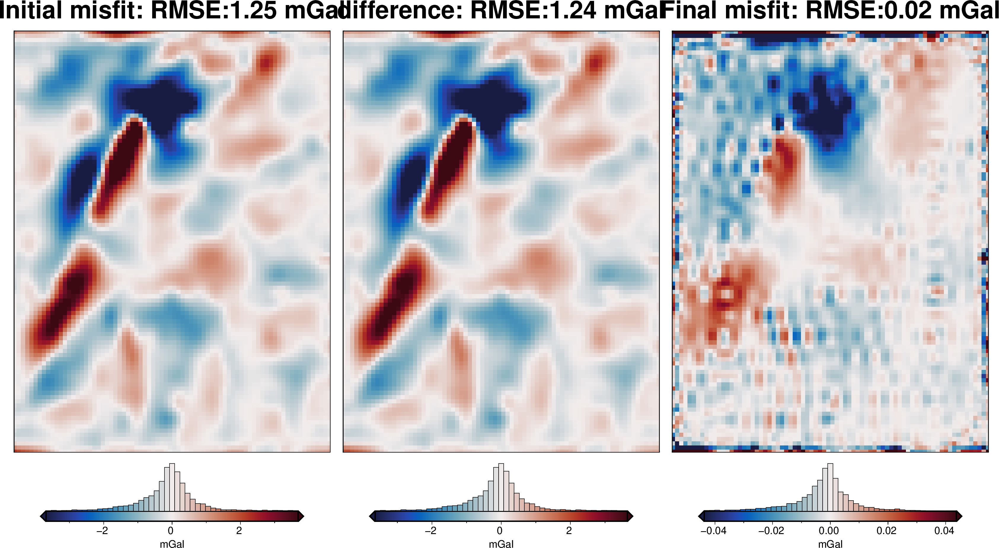

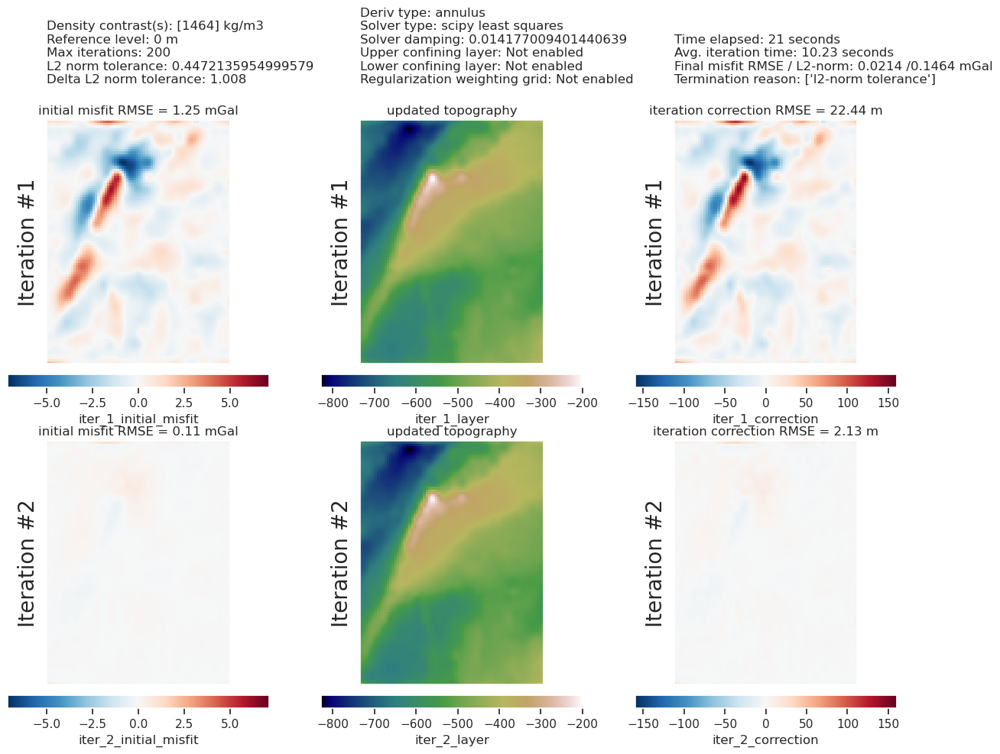

In [46]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

In [47]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 19.21 m


In [48]:
# save to csv
constraint_points.to_csv(f"{fpath}_constraint_points.csv", index=False)

In [49]:
constraint_points = pd.read_csv(f"{fpath}_constraint_points.csv")
constraint_points

,northing,easting,inside,true_upward,upward,starting_bathymetry,inverted_topography
0,-1.600000e+06,-4.000000e+04,False,-601.093994,-601.093994,-601.093994,-517.513184
1,-1.600000e+06,-3.800000e+04,False,-609.216919,-609.216919,-609.216919,-540.226440
2,-1.600000e+06,-3.600000e+04,False,-616.355957,-616.355957,-616.355957,-557.244324
3,-1.600000e+06,-3.400000e+04,False,-621.262268,-621.262268,-621.262268,-565.657104
4,-1.600000e+06,-3.200000e+04,False,-625.510925,-625.510925,-625.510925,-574.122864
...,...,...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305711,-747.305711,-747.289192,-754.926166
882,-1.418571e+06,2.333333e+04,True,-619.672055,-619.672055,-619.459742,-622.551962
883,-1.418571e+06,4.666667e+04,True,-505.761536,-505.761536,-505.739808,-507.541911
884,-1.418571e+06,7.000000e+04,True,-447.753091,-447.753091,-447.782831,-448.868460


## Uncertainty analysis

### Inversion error

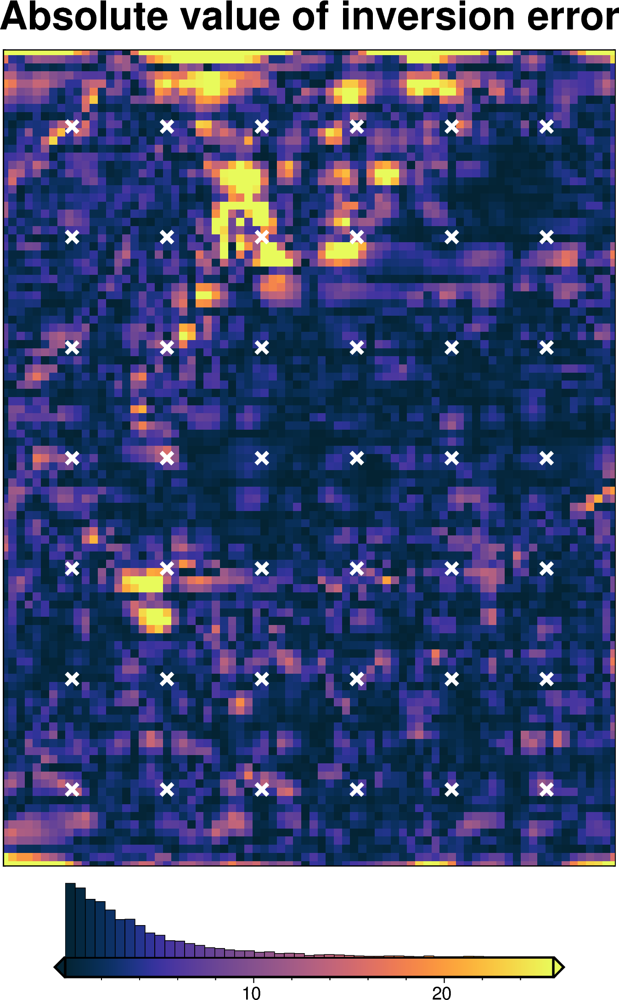

In [50]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=inversion_region,
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [51]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

### Solver damping component

In [52]:
# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev / 2
print(f"using stdev: {stdev}")

calculated stdev: 0.4893215801036921
using stdev: 0.24466079005184604


best: 0.014177009401440639 
std: 0.24466079005184604 
+1std: 0.0249026415526624 
-1std: 0.008070934769851684


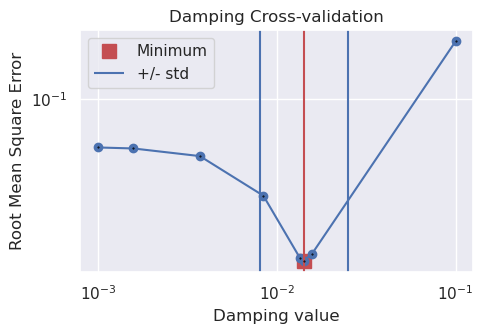

In [53]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

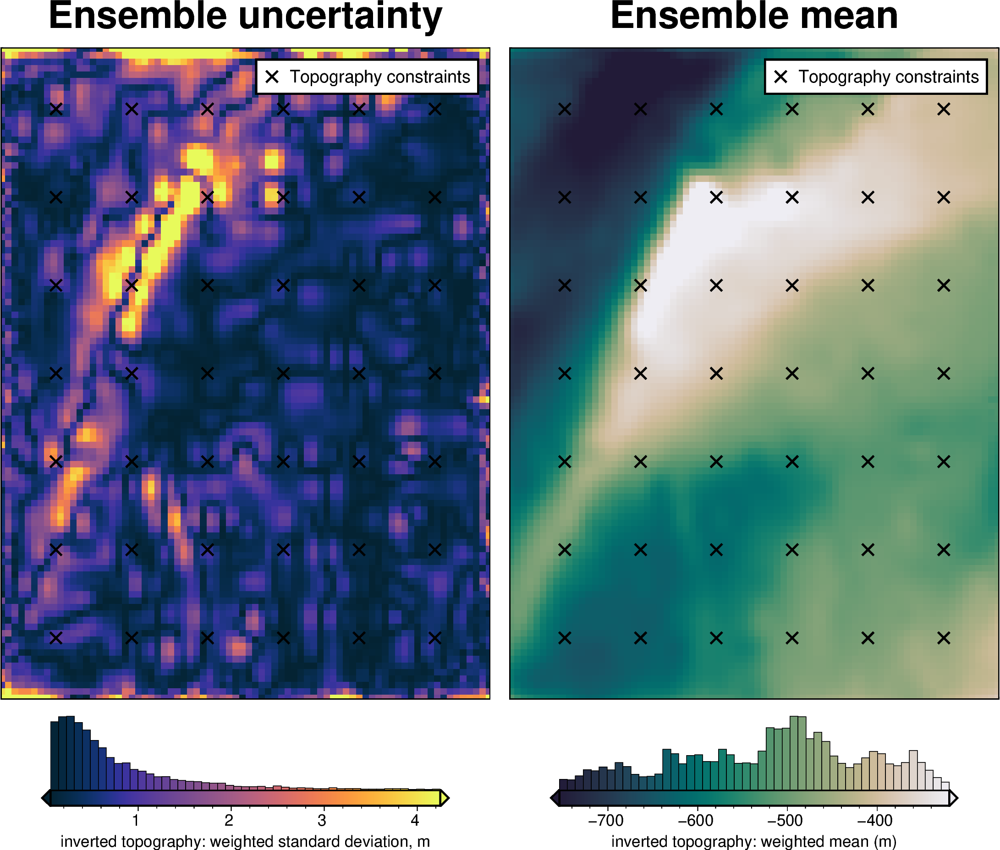

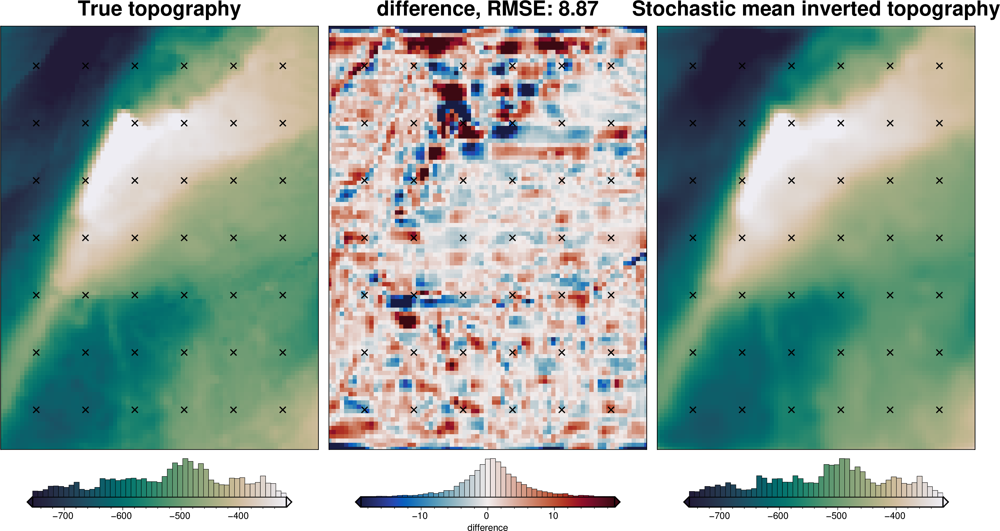

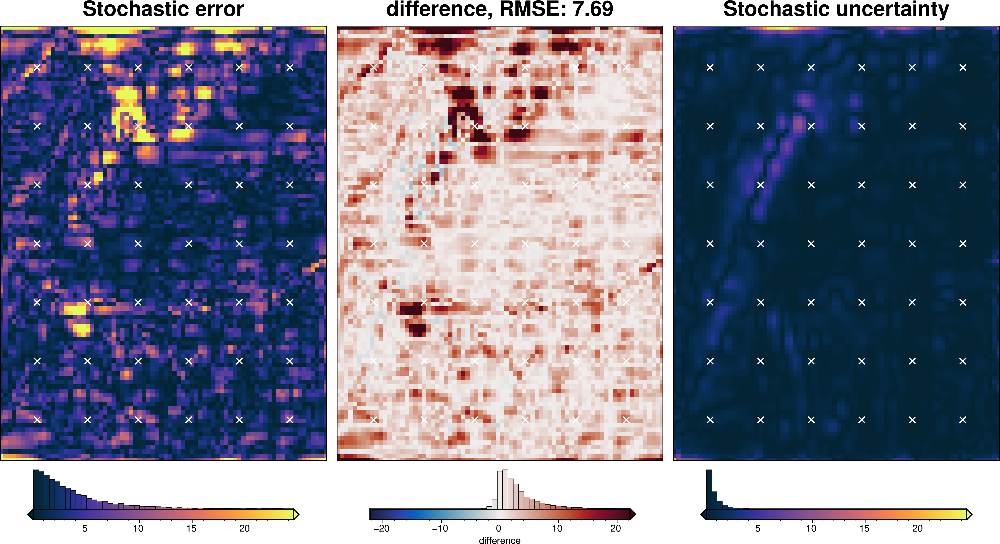

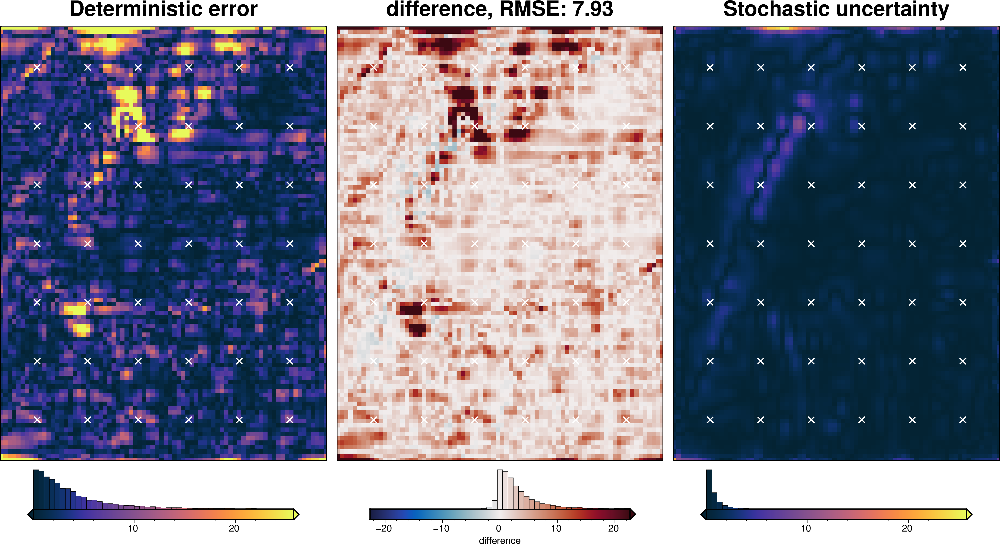

In [54]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = f"{fpath}_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Density component

In [55]:
# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 20
print(f"using stdev: {stdev}")

print(
    f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}"
)

calculated stdev: 422.705518719067
using stdev: 20
density estimation error: 12


best: 1464 
std: 20 
+1std: 1484 
-1std: 1444


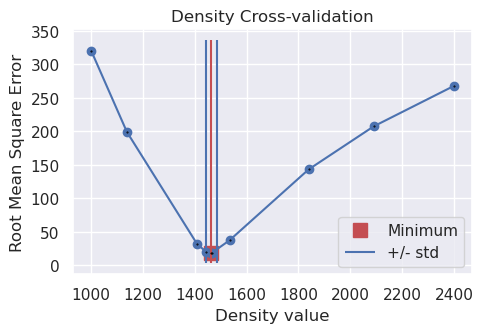

In [56]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.to_numpy(),
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

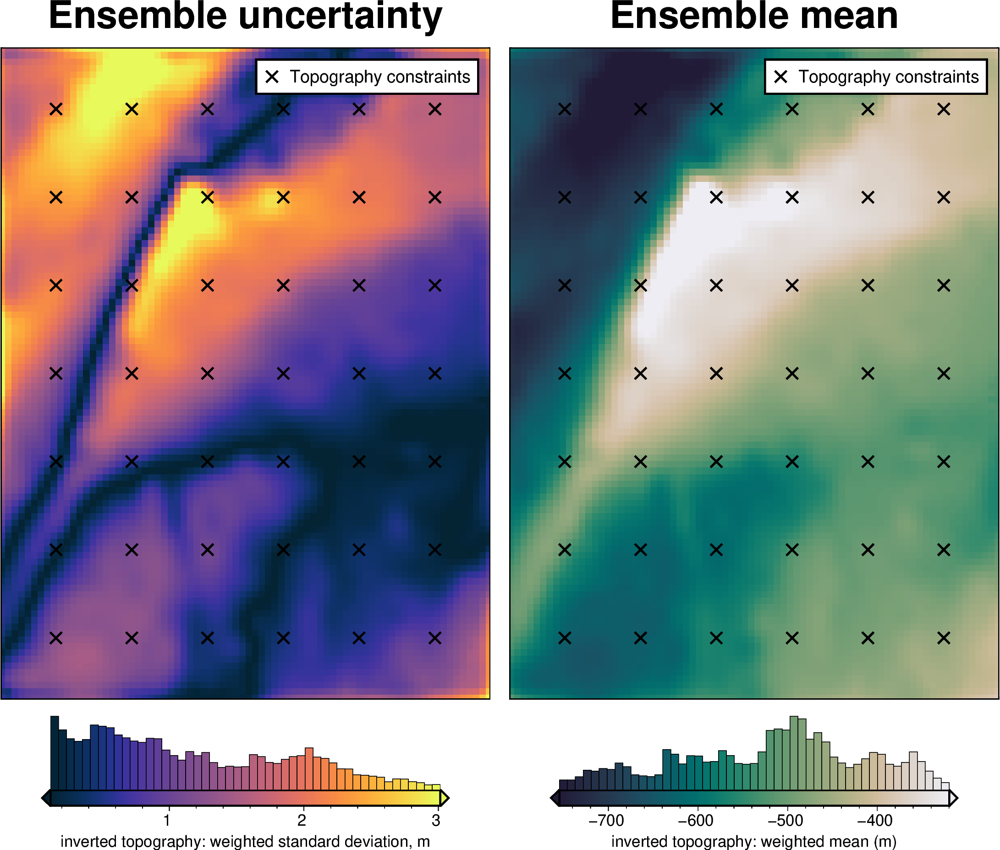

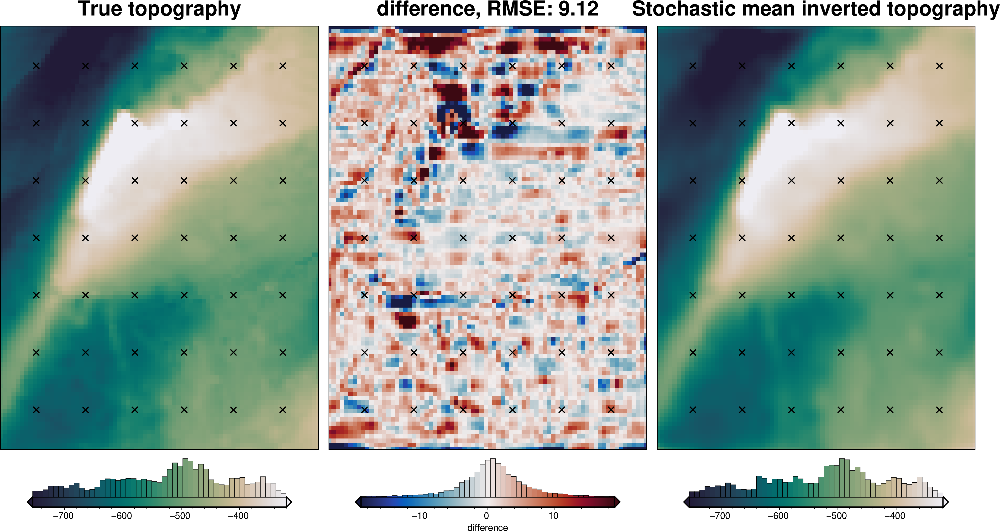

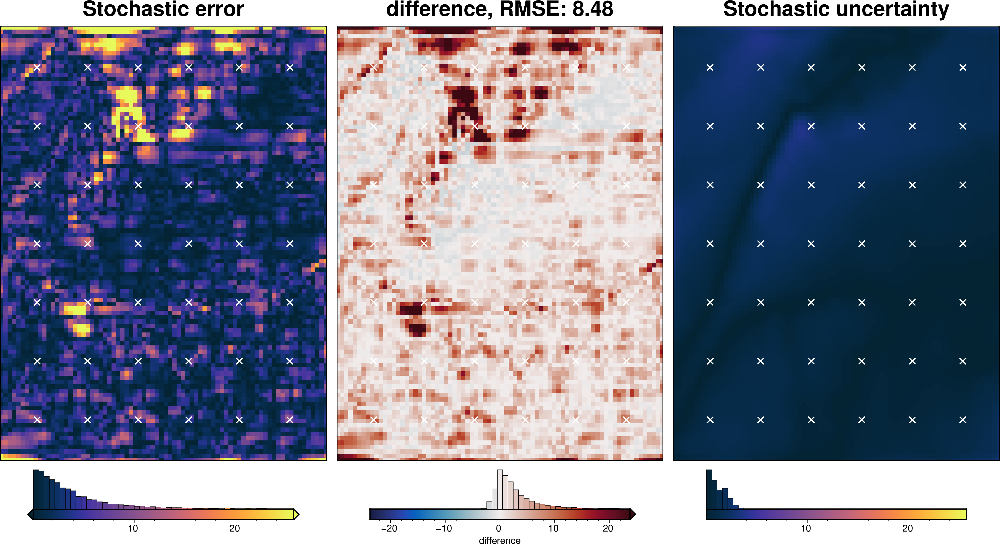

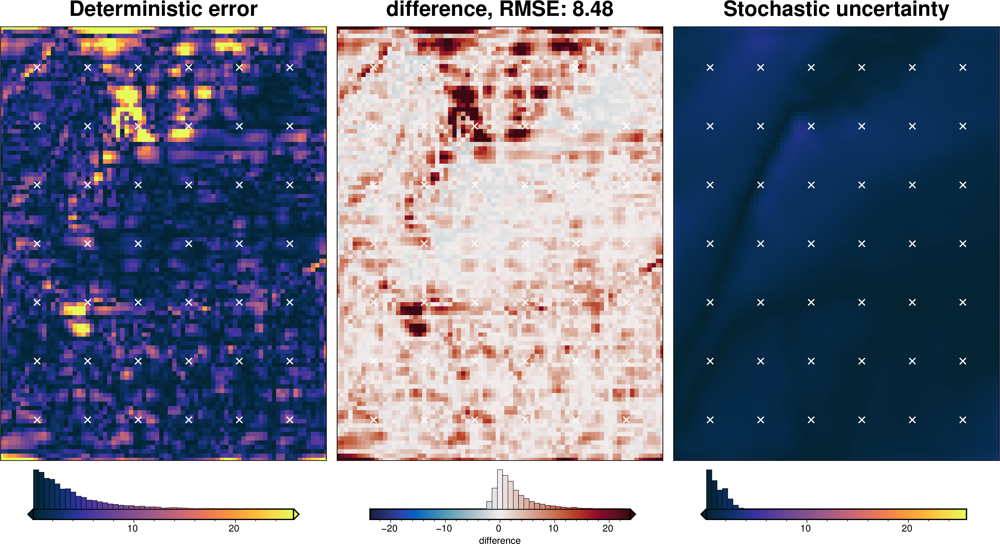

In [57]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = f"{fpath}_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Equivalent source gridding component

In [58]:
eqs.depth, eqs.damping

(10002.265810449084, 0.0016430661458014173)

In [1]:
import numpy as np

np.log10(0.0016430661458014173)

np.float64(-2.7843449525854407)

starting equivalent sources ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

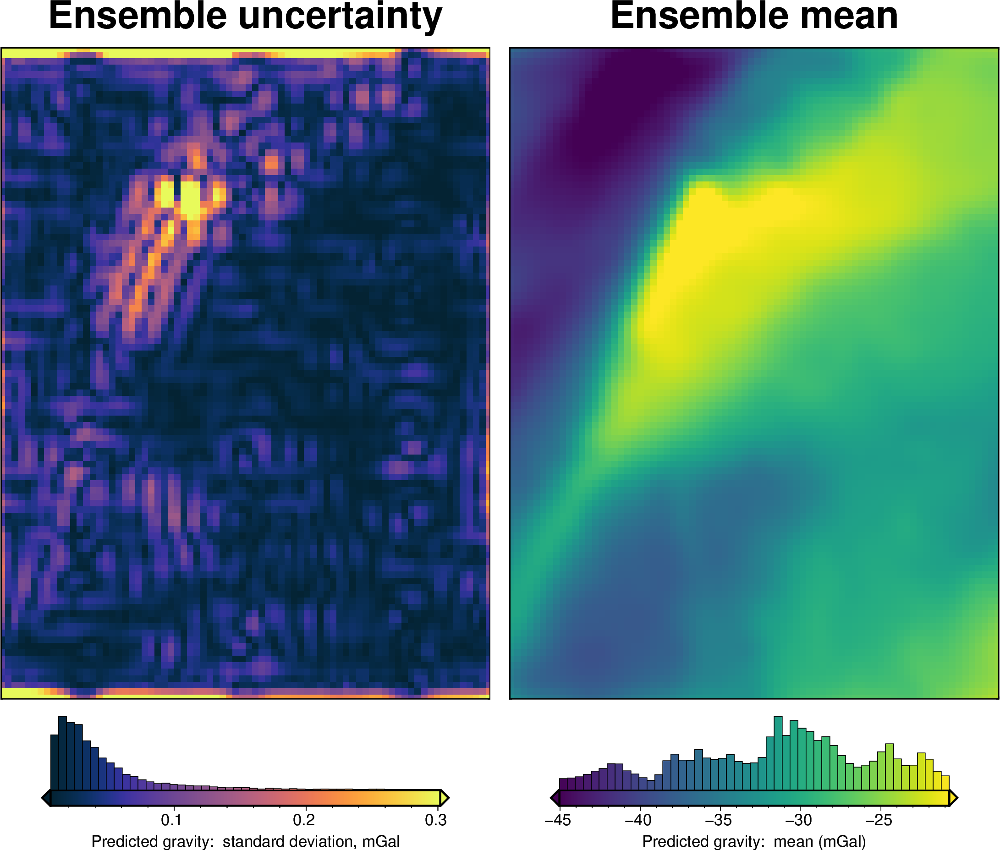

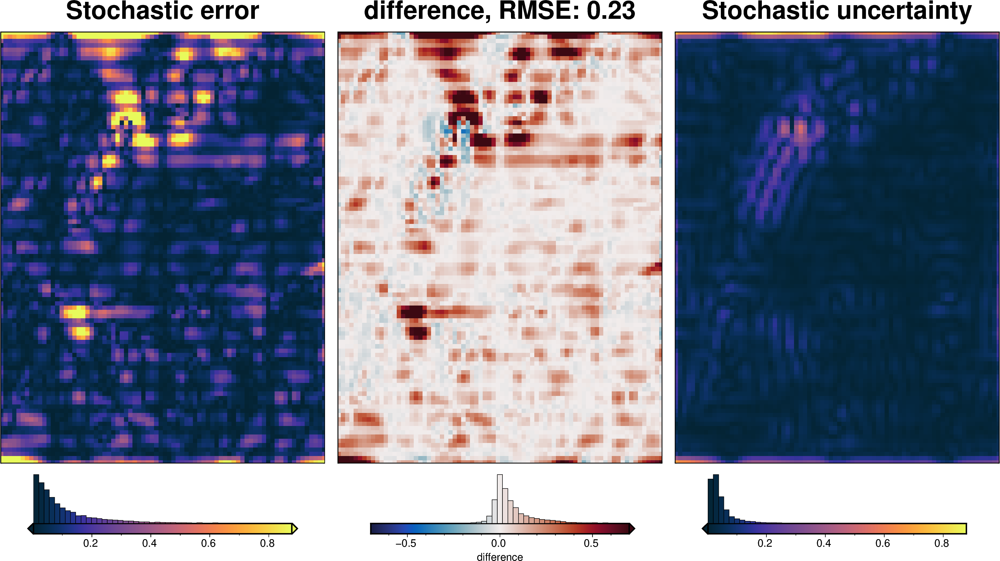

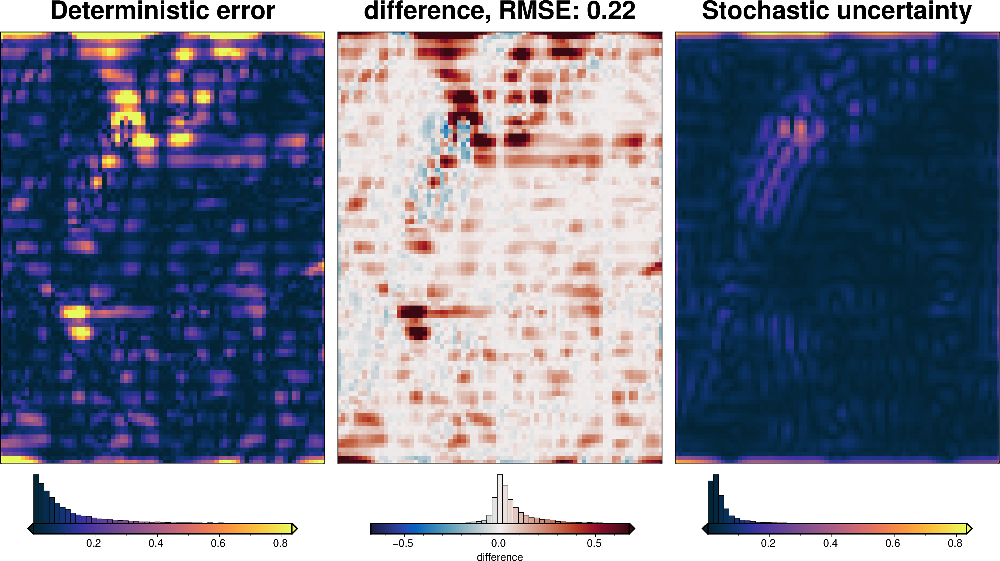

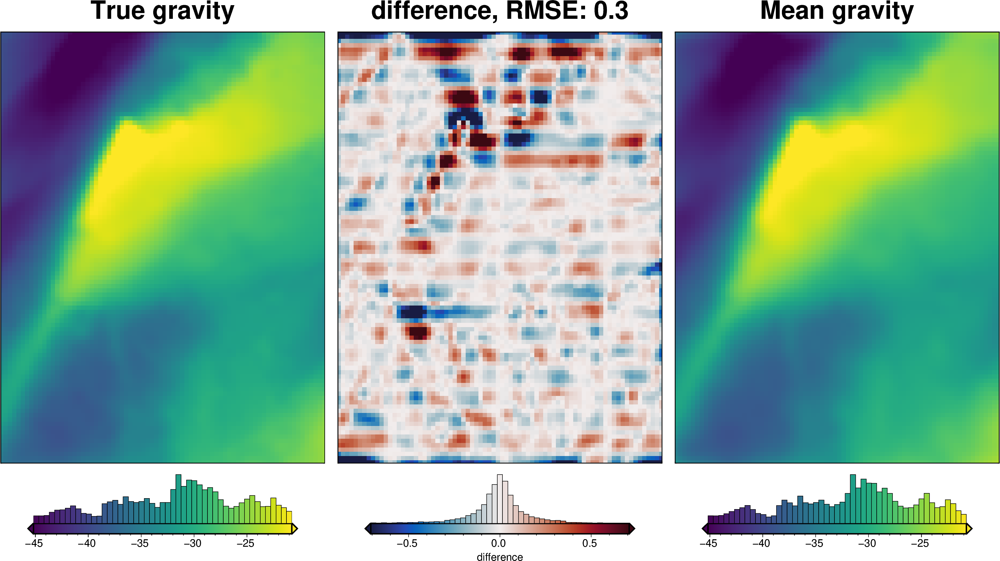

In [59]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

equivalent_source_parameter_dict = {
    "depth": {
        "distribution": "normal",
        "loc": eqs.depth,  # mean
        "scale": eqs.depth / 4,  # standard deviation
    },
    "damping": {
        "log": True,
        "distribution": "normal",
        "loc": np.log10(
            eqs.damping
        ),  # mean of base 10 exponent, supply log10(value) here
        "scale": 2,
    },
}

eqs_kwargs = dict(block_size=spacing, damping=eqs.damping, depth=eqs.depth)

grd = grav_df.set_index(["northing", "easting"]).to_xarray()
eqs_stats, _ = uncertainty.equivalent_sources_uncertainty(
    runs=10,
    data=data,
    coords=coords,
    grid_points=grav_df,
    parameter_dict=equivalent_source_parameter_dict,
    plot_region=inversion_region,
    true_gravity=grd.gravity_anomaly_full_res,
    deterministic_error=grd.gravity_anomaly_full_res - grd.gravity_anomaly,
    **eqs_kwargs,
)

In [60]:
grav_df = utils.sample_grids(
    grav_df,
    eqs_stats.z_stdev,
    sampled_name="eqs_uncert",
    coord_names=["easting", "northing"],
)
grav_df = utils.sample_grids(
    grav_df,
    eqs_stats.z_mean,
    sampled_name="gravity_anomaly_eqs_mean",
    coord_names=["easting", "northing"],
)
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,misfit,reg,res,predicted_grav,eqs_uncert,gravity_anomaly_eqs_mean
0,-1600000.0,-40000.0,1000.0,-35.551055,0,-35.551055,-35.551055,-33.273917,-33.273917,-35.289305,2.015388,-0.2291,2.244487,-32.866954,0.679666,-33.125317
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-36.054657,-33.983594,-33.983594,-35.749612,1.766018,-0.2291,1.995117,-33.558906,0.640888,-33.856945
2,-1600000.0,-36000.0,1000.0,-36.473147,0,-36.473147,-36.473147,-34.554225,-34.554225,-36.163672,1.609447,-0.2291,1.838546,-34.134524,0.630313,-34.440243
3,-1600000.0,-34000.0,1000.0,-36.755609,0,-36.755609,-36.755609,-35.014135,-35.014135,-36.485586,1.471451,-0.2291,1.700551,-34.604643,0.615711,-34.902172
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-36.951029,-35.365702,-35.365702,-36.697668,1.331966,-0.2291,1.561066,-34.970598,0.589974,-35.250641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-25.760090,-24.851786,-24.851786,-25.290878,0.439091,-0.2291,0.668191,-24.645140,0.310813,-24.787649
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-25.911429,-24.853220,-24.853220,-25.465050,0.611830,-0.2291,0.840929,-24.638210,0.336113,-24.790991
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-26.032814,-24.843369,-24.843369,-25.598964,0.755595,-0.2291,0.984695,-24.612773,0.356042,-24.773582
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-26.121903,-24.781222,-24.781222,-25.693927,0.912705,-0.2291,1.141805,-24.539817,0.379788,-24.692001


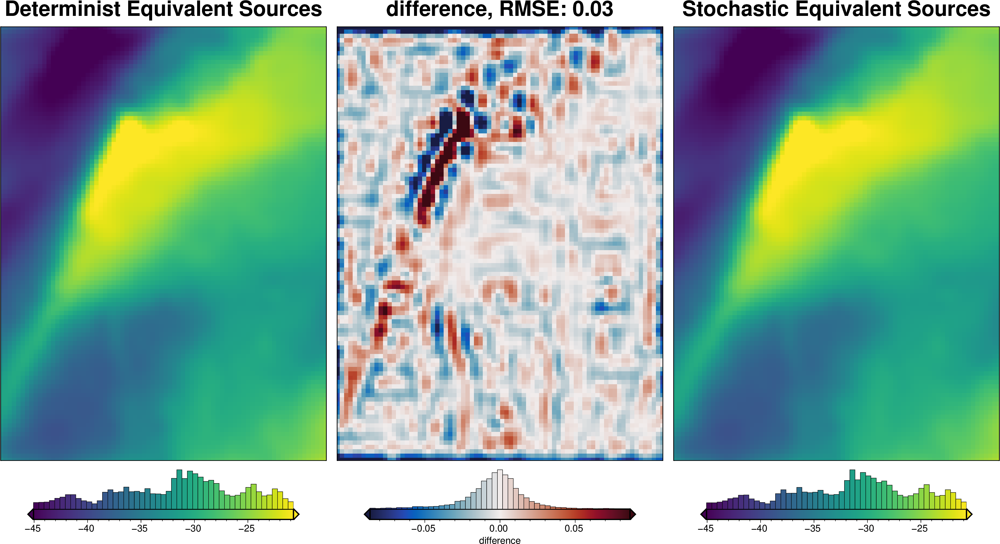

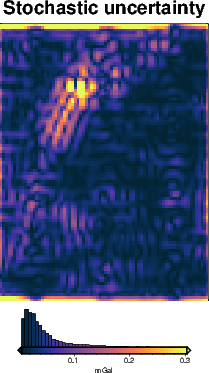

In [61]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
_ = polar_utils.grd_compare(
    grav_grid.gravity_anomaly,
    grav_grid.gravity_anomaly_eqs_mean,
    region=inversion_region,
    plot=True,
    grid1_name="Determinist Equivalent Sources",
    grid2_name="Stochastic Equivalent Sources",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
)
maps.plot_grd(
    grav_grid.eqs_uncert,
    region=inversion_region,
    fig_height=10,
    title="Stochastic uncertainty",
    cmap="thermal",
    hist=True,
    robust=True,
    cbar_label="mGal",
)

In [62]:
# update grav_df and rename columns
grav_df_eqs = grav_df.copy()
grav_df_eqs = grav_df_eqs.rename(
    columns={
        "gravity_anomaly": "gravity_anomaly_deterministic",
        "uncert": "uncert_constant",
    }
)
grav_df_eqs["gravity_anomaly"] = grav_df_eqs.gravity_anomaly_eqs_mean
grav_df_eqs["uncert"] = grav_df_eqs.eqs_uncert

uncert_kwargs["grav_df"] = grav_df_eqs

In [63]:
grav_df_eqs.uncert.mean()

np.float64(0.05353783539180543)

In [64]:
grav_df_eqs = regional.regional_separation(
    grav_df=grav_df_eqs,
    **regional_grav_kwargs,
)

# kwargs to reuse for all uncertainty analyses
eqs_uncert_kwargs = dict(
    grav_df=grav_df_eqs,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

In [65]:
# save to csv
grav_df_eqs.to_csv(f"{fpath}_grav_df.csv", index=False)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

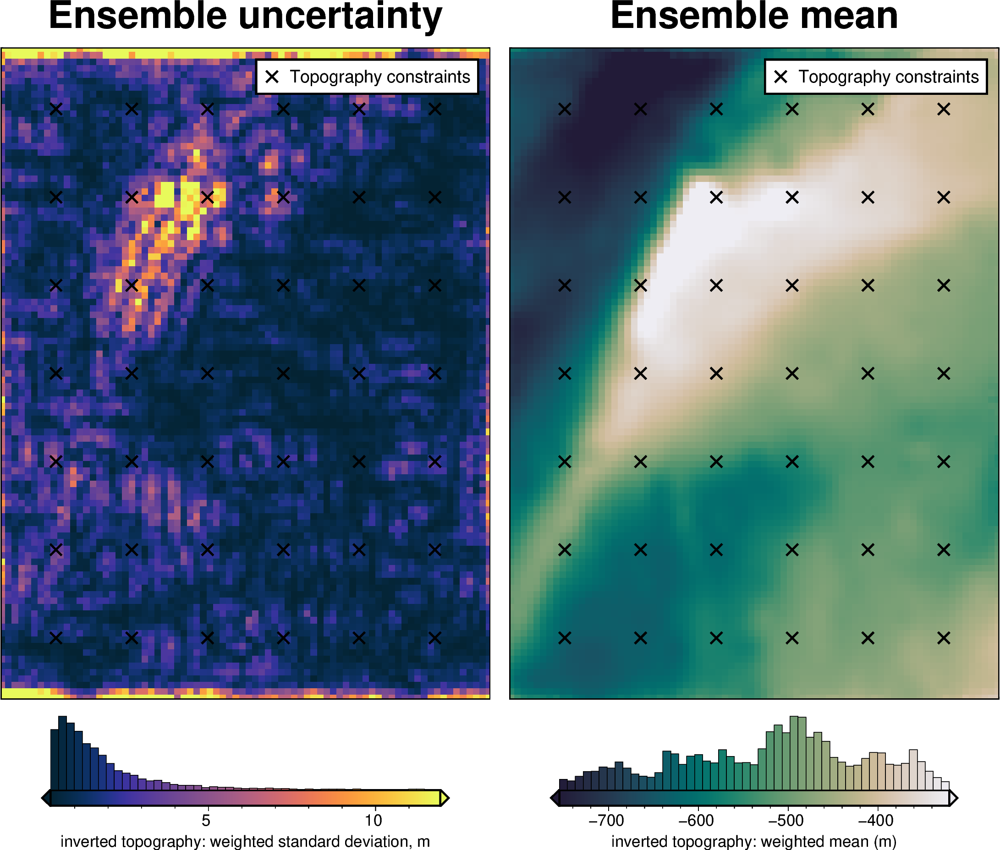

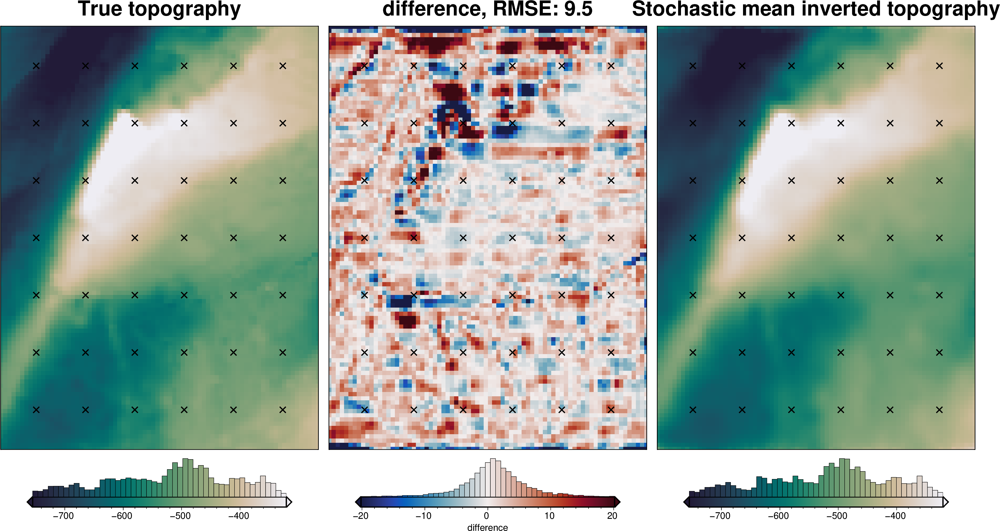

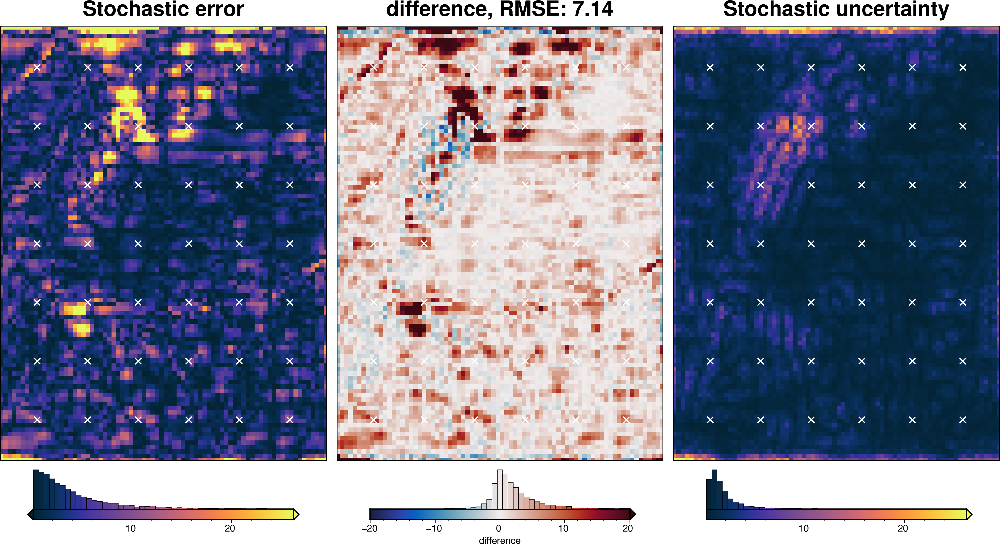

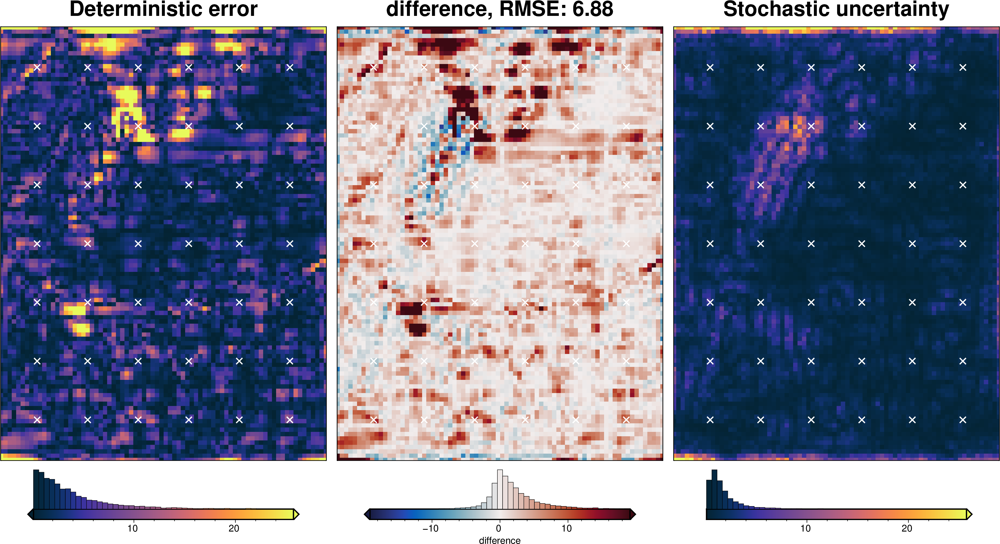

In [66]:
fname = f"{fpath}_uncertainty_eq_sources"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_eq_sources_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    **eqs_uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_eq_sources_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Total uncertainty

stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

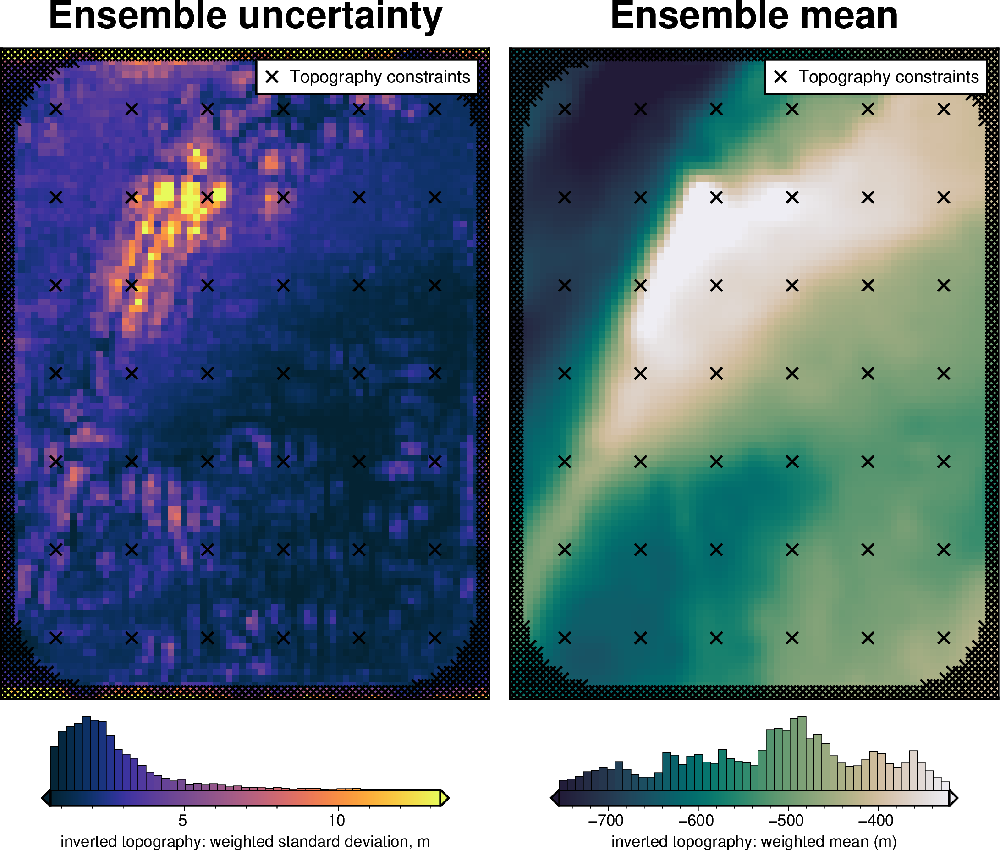

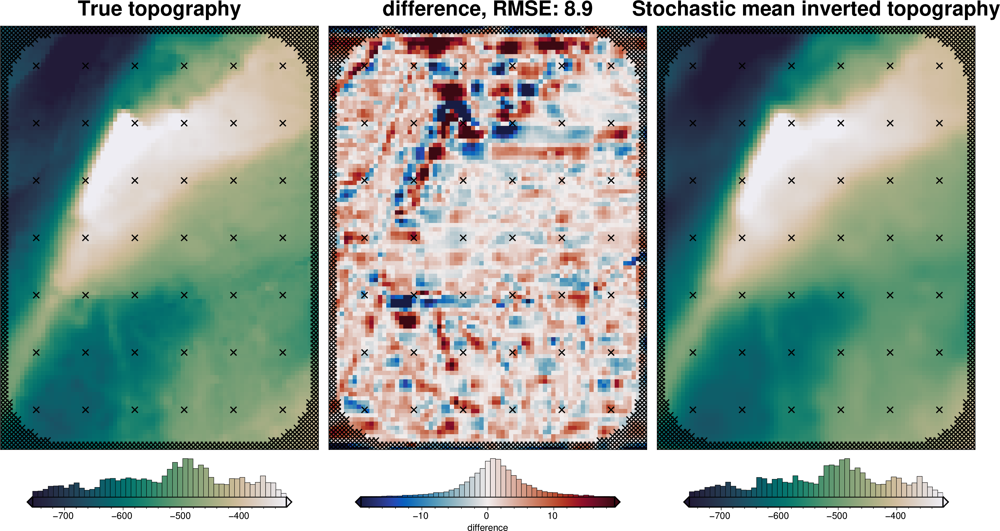

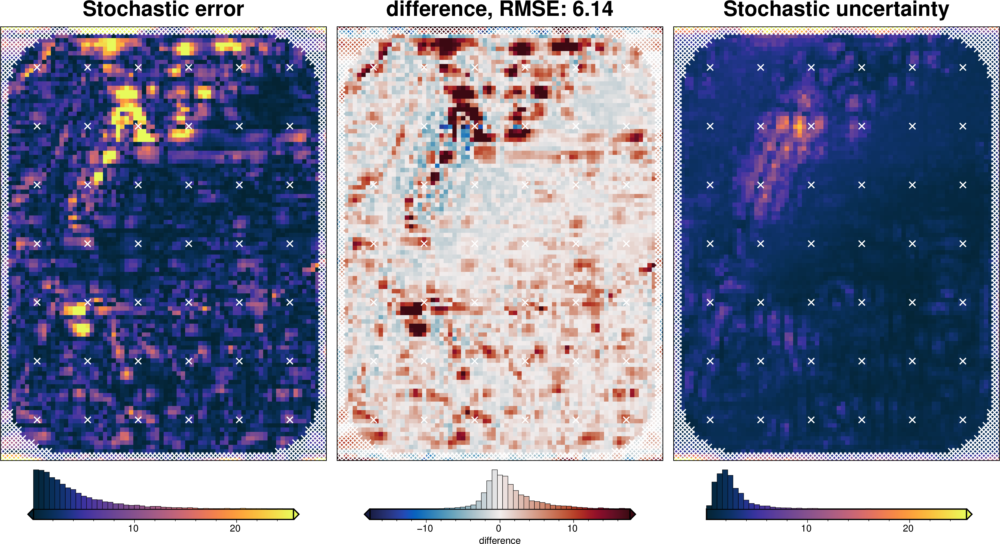

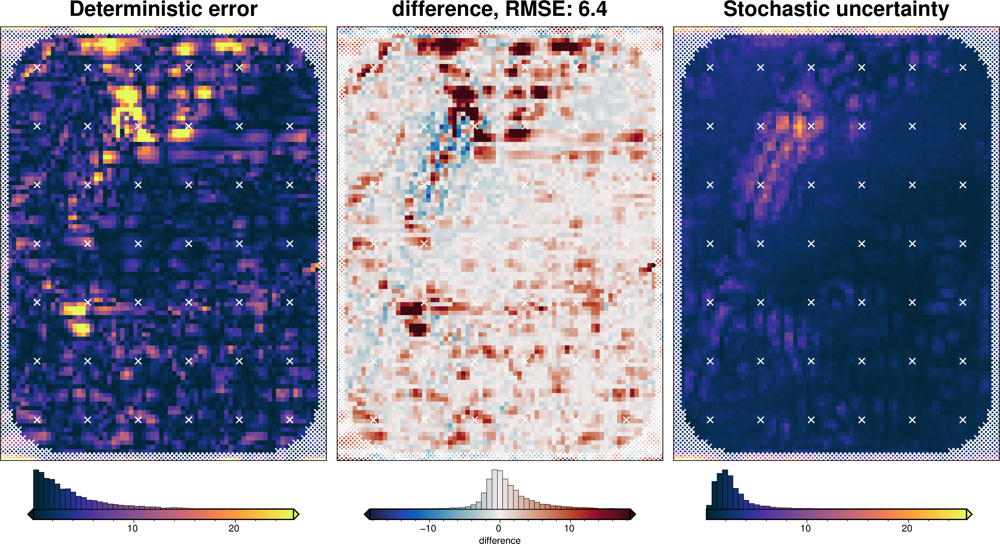

In [67]:
fname = f"{fpath}_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    sample_gravity=True,
    parameter_dict=solver_dict | density_dict,
    **eqs_uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
)

### Comparing results

In [68]:
results = [
    uncert_results,
    uncert_eq_sources_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=inversion_region,
    )
    stats.append(ds)

In [69]:
names = [
    "full",
    "equivalent source gridding",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 247kB
Dimensions:                           (northing: 101, easting: 76)
Coordinates:
  * northing                          (northing) float64 808B -1.6e+06 ... -1...
  * easting                           (easting) float64 608B -4e+04 ... 1.1e+05
Data variables:
    full_stdev                        (northing, easting) float64 61kB 36.93 ...
    equivalent source gridding_stdev  (northing, easting) float64 61kB 28.56 ...
    density_stdev                     (northing, easting) float64 61kB 0.6489...
    damping_stdev                     (northing, easting) float64 61kB 23.12 ...

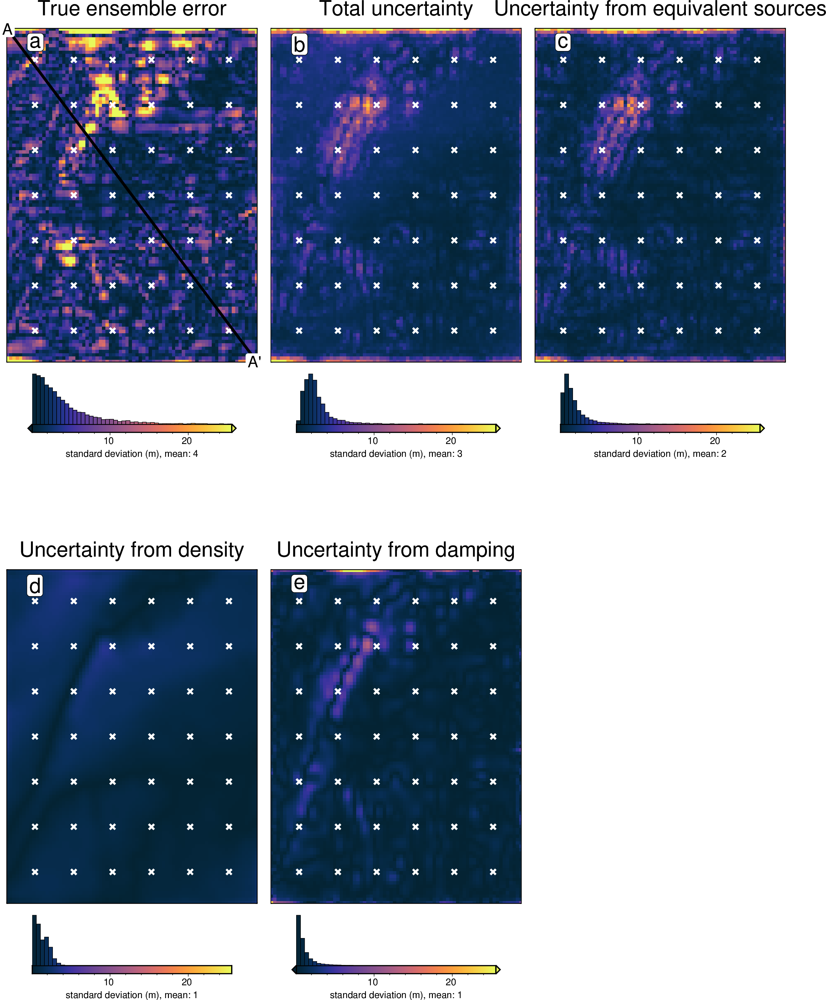

In [70]:
titles = [
    "True ensemble error",
    "Total uncertainty",
    "Uncertainty from equivalent sources",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 3:
        origin_shift = "both_shift"
        xshift_amount = -2
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


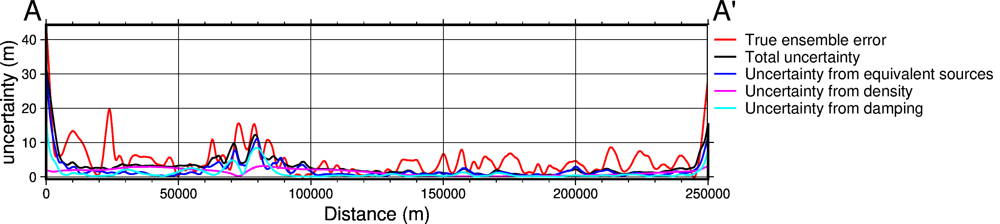

In [71]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

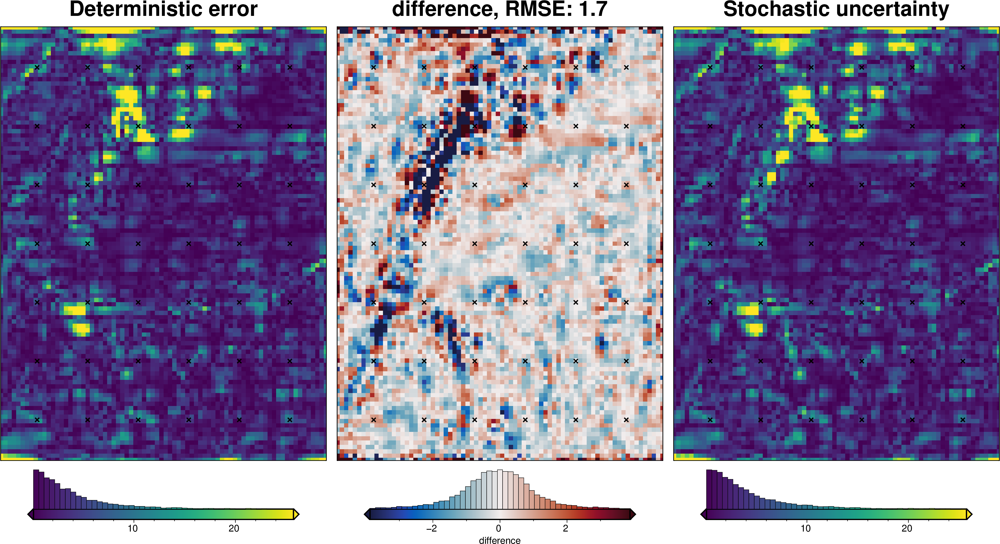

In [72]:
_ = polar_utils.grd_compare(
    inversion_error,
    np.abs(stats[0].weighted_mean - bathymetry),
    region=inversion_region,
    plot=True,
    grid1_name="Deterministic error",
    grid2_name="Stochastic uncertainty",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [73]:
# save results
merged.to_netcdf(f"{fpath}_sensitivity.nc")

In [74]:
stats_ds.to_netcdf(f"{fpath}_uncertainty.nc")